In [3]:
!pip install -q "huggingface_hub>=0.34.0,<1.0" torchmetrics torch-fidelity "torchmetrics[image]"

import pathlib

# patch diffusers dynamic_modules_utils (usuwa cached_download)
dmu_path = pathlib.Path("/usr/local/lib/python3.12/dist-packages/diffusers/utils/dynamic_modules_utils.py")
print("Plik istnieje:", dmu_path.exists())
text = dmu_path.read_text()

old = "from huggingface_hub import cached_download, hf_hub_download, model_info"
new = "from huggingface_hub import hf_hub_download, model_info"

if old in text:
    text = text.replace(old, new)
    dmu_path.write_text(text)
    print("Zmieniono import: usunięto cached_download.")
else:
    print("Nie znaleziono linijki z cached_download – prawdopodobnie już jest OK.")

from torchmetrics.image.fid import FrechetInceptionDistance
print("FID załadowany OK")

import os
import math
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from PIL import Image
from tqdm.auto import tqdm
import matplotlib.pyplot as plt

from diffusers import StableDiffusionPipeline, DDPMScheduler

from google.colab import drive
drive.mount('/content/drive')

device = "cuda" if torch.cuda.is_available() else "cpu"
print("Device:", device)

# Ścieżki pod LIDC
LIDC_ROOT   = "/content/drive/MyDrive/lidc_lora/LIDC"
IMAGES_DIR  = os.path.join(LIDC_ROOT, "image")
CSV_PATH    = os.path.join(LIDC_ROOT, "captions_lidc_lora.csv")
EDGE_DIR    = os.path.join(LIDC_ROOT, "image_roi_edge", "prewitt")  # ControlNet input

print("CSV:", CSV_PATH, os.path.exists(CSV_PATH))
print("IMG DIR:", IMAGES_DIR, os.path.exists(IMAGES_DIR))
print("EDGE DIR:", EDGE_DIR, os.path.exists(EDGE_DIR))

# Katalog na checkpointy i wytrenowany model
EXP_ROOT  = "/content/drive/MyDrive/lidc_lora"
CKPT_DIR  = os.path.join(EXP_ROOT, "unet_ckpts_lidc_wide")
SAVE_DIR  = os.path.join(EXP_ROOT, "sd15_ct_finetuned_unet_lidc_wide")
CN_SAVE_DIR = os.path.join(EXP_ROOT, "sd15_ct_finetuned_unet_lidc_wide_controlnet_prewitt")

os.makedirs(CKPT_DIR, exist_ok=True)
os.makedirs(SAVE_DIR, exist_ok=True)
os.makedirs(CN_SAVE_DIR, exist_ok=True)


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 983.2/983.2 kB 17.5 MB/s eta 0:00:00
Plik istnieje: True
Nie znaleziono linijki z cached_download – prawdopodobnie już jest OK.
FID załadowany OK
Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Device: cuda
CSV: /content/drive/MyDrive/lidc_lora/LIDC/captions_lidc_lora.csv True
IMG DIR: /content/drive/MyDrive/lidc_lora/LIDC/image True
EDGE DIR: /content/drive/MyDrive/lidc_lora/LIDC/image_roi_edge/prewitt True


In [2]:
full_df = pd.read_csv(CSV_PATH)
print("Liczba wszystkich próbek:", len(full_df))

# deterministyczny shuffle + split 85/15
full_df = full_df.sample(frac=1.0, random_state=42).reset_index(drop=True)
split_idx = int(0.85 * len(full_df))

train_df = full_df.iloc[:split_idx].reset_index(drop=True)
val_df   = full_df.iloc[split_idx:].reset_index(drop=True)

print("Train:", len(train_df), "Val:", len(val_df))

train_df.head()


Liczba wszystkich próbek: 7521
Train: 6392 Val: 1129


,file_name,image_path,mask_path,prompt
0,LIDC_2338.png,/content/drive/MyDrive/lidc_lora/LIDC/image/LI...,/content/drive/MyDrive/lidc_lora/LIDC/mask/LID...,"axial lung CT, single pulmonary nodule, locate..."
1,LIDC_7251.png,/content/drive/MyDrive/lidc_lora/LIDC/image/LI...,/content/drive/MyDrive/lidc_lora/LIDC/mask/LID...,"axial lung CT, single pulmonary nodule, locate..."
2,LIDC_5859.png,/content/drive/MyDrive/lidc_lora/LIDC/image/LI...,/content/drive/MyDrive/lidc_lora/LIDC/mask/LID...,"axial lung CT, single pulmonary nodule, locate..."
3,LIDC_6608.png,/content/drive/MyDrive/lidc_lora/LIDC/image/LI...,/content/drive/MyDrive/lidc_lora/LIDC/mask/LID...,"axial lung CT, single pulmonary nodule, locate..."
4,LIDC_0676.png,/content/drive/MyDrive/lidc_lora/LIDC/image/LI...,/content/drive/MyDrive/lidc_lora/LIDC/mask/LID...,"axial lung CT, single pulmonary nodule, locate..."


In [ ]:
class LIDCLungCTDataset(Dataset):
    def __init__(self, df, image_root, resolution=512):
        self.df = df.reset_index(drop=True)
        self.image_root = image_root
        self.transform = transforms.Compose([
            transforms.Resize((resolution, resolution)),
            transforms.ToTensor(),
            transforms.Normalize([0.5]*3, [0.5]*3)  # [0,1] -> [-1,1]
        ])

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        row = self.df.iloc[idx]
        img_path = os.path.join(self.image_root, row["file_name"])
        image = Image.open(img_path).convert("RGB")
        image = self.transform(image)
        prompt = row["prompt"]
        return {"pixel_values": image, "prompt": prompt}

train_dataset = LIDCLungCTDataset(train_df, IMAGES_DIR, resolution=512)
val_dataset   = LIDCLungCTDataset(val_df,   IMAGES_DIR, resolution=512)

batch_size = 2

train_dataloader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True,  num_workers=2)
val_dataloader   = DataLoader(val_dataset,   batch_size=batch_size, shuffle=False, num_workers=2)

print("Train batches:", len(train_dataloader), "Val batches:", len(val_dataloader))


Train batches: 3196 Val batches: 565


In [ ]:
from diffusers import StableDiffusionPipeline, DDPMScheduler

model_id = "runwayml/stable-diffusion-v1-5"   # start z czystego SD1.5

pipe = StableDiffusionPipeline.from_pretrained(
    model_id,
    torch_dtype=torch.float32,   # trening w fp32
    safety_checker=None,
).to(device)

noise_scheduler = DDPMScheduler.from_config(pipe.scheduler.config)

tokenizer     = pipe.tokenizer
text_encoder  = pipe.text_encoder
unet          = pipe.unet
vae           = pipe.vae

vae.requires_grad_(False)
text_encoder.requires_grad_(False)

# zamrażamy wszystko
unet.requires_grad_(False)

# ODMRAŻAMY: mid_block + up_blocks.2/.3 + down_blocks.3
for name, param in unet.named_parameters():
    if (
        "mid_block"   in name
        or "up_blocks.2" in name
        or "up_blocks.3" in name
        or "down_blocks.3" in name
    ):
        param.requires_grad = True

trainable_params = [p for p in unet.parameters() if p.requires_grad]
print("Trenowanych parametrów UNet:", sum(p.numel() for p in trainable_params))

learning_rate   = 5e-6
optimizer       = torch.optim.AdamW(
    trainable_params,
    lr=learning_rate,
    betas=(0.9, 0.999),
    weight_decay=1e-2,
)

max_train_steps  = 20000
scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(
    optimizer,
    T_max=max_train_steps,
    eta_min=1e-6,
)

def save_unet_checkpoint(unet, step):
    path = os.path.join(CKPT_DIR, f"unet_step_{step:05d}.pt")
    torch.save(unet.state_dict(), path)
    print(f"[CKPT] Zapisano UNet: {path}")


/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


model_index.json:   0%|          | 0.00/541 [00:00<?, ?B/s]

Fetching 13 files:   0%|          | 0/13 [00:00<?, ?it/s]

merges.txt: 0.00B [00:00, ?B/s]

tokenizer_config.json:   0%|          | 0.00/806 [00:00<?, ?B/s]

scheduler_config.json:   0%|          | 0.00/308 [00:00<?, ?B/s]

vocab.json: 0.00B [00:00, ?B/s]

special_tokens_map.json:   0%|          | 0.00/472 [00:00<?, ?B/s]

preprocessor_config.json:   0%|          | 0.00/342 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/617 [00:00<?, ?B/s]

text_encoder/model.safetensors:   0%|          | 0.00/492M [00:00<?, ?B/s]

config.json:   0%|          | 0.00/547 [00:00<?, ?B/s]

unet/diffusion_pytorch_model.safetensors:   0%|          | 0.00/3.44G [00:00<?, ?B/s]

vae/diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

config.json:   0%|          | 0.00/743 [00:00<?, ?B/s]

KeyboardInterrupt: 

Epoch 1:   0%|          | 0/3196 [00:00<?, ?it/s]

[VAL] Epoch 1, step 799, val_loss=0.1026


Epoch 2:   0%|          | 0/3196 [00:00<?, ?it/s]

[VAL] Epoch 2, step 1598, val_loss=0.0947


Epoch 3:   0%|          | 0/3196 [00:00<?, ?it/s]

[CKPT] Zapisano UNet: /content/drive/MyDrive/lidc_lora/unet_ckpts_lidc_wide/unet_step_02000.pt
[VAL] Epoch 3, step 2397, val_loss=0.0908


Epoch 4:   0%|          | 0/3196 [00:00<?, ?it/s]

[VAL] Epoch 4, step 3196, val_loss=0.0913


Epoch 5:   0%|          | 0/3196 [00:00<?, ?it/s]

[VAL] Epoch 5, step 3995, val_loss=0.0970


Epoch 6:   0%|          | 0/3196 [00:00<?, ?it/s]

[CKPT] Zapisano UNet: /content/drive/MyDrive/lidc_lora/unet_ckpts_lidc_wide/unet_step_04000.pt
[VAL] Epoch 6, step 4794, val_loss=0.0869


Epoch 7:   0%|          | 0/3196 [00:00<?, ?it/s]

[VAL] Epoch 7, step 5593, val_loss=0.0929


Epoch 8:   0%|          | 0/3196 [00:00<?, ?it/s]

[CKPT] Zapisano UNet: /content/drive/MyDrive/lidc_lora/unet_ckpts_lidc_wide/unet_step_06000.pt
[VAL] Epoch 8, step 6392, val_loss=0.0888


Epoch 9:   0%|          | 0/3196 [00:00<?, ?it/s]

[VAL] Epoch 9, step 7191, val_loss=0.0953


Epoch 10:   0%|          | 0/3196 [00:00<?, ?it/s]

[VAL] Epoch 10, step 7990, val_loss=0.0946


Epoch 11:   0%|          | 0/3196 [00:00<?, ?it/s]

[CKPT] Zapisano UNet: /content/drive/MyDrive/lidc_lora/unet_ckpts_lidc_wide/unet_step_08000.pt
[VAL] Epoch 11, step 8789, val_loss=0.0947


Epoch 12:   0%|          | 0/3196 [00:00<?, ?it/s]

[VAL] Epoch 12, step 9588, val_loss=0.0957


Epoch 13:   0%|          | 0/3196 [00:00<?, ?it/s]

[VAL] Epoch 13, step 10387, val_loss=0.0953


Epoch 14:   0%|          | 0/3196 [00:00<?, ?it/s]

[VAL] Epoch 14, step 11186, val_loss=0.0852


Epoch 15:   0%|          | 0/3196 [00:00<?, ?it/s]

[VAL] Epoch 15, step 11985, val_loss=0.1007


Epoch 16:   0%|          | 0/3196 [00:00<?, ?it/s]

[CKPT] Zapisano UNet: /content/drive/MyDrive/lidc_lora/unet_ckpts_lidc_wide/unet_step_12000.pt
[VAL] Epoch 16, step 12784, val_loss=0.0883


Epoch 17:   0%|          | 0/3196 [00:00<?, ?it/s]

[VAL] Epoch 17, step 13583, val_loss=0.0869


Epoch 18:   0%|          | 0/3196 [00:00<?, ?it/s]

[VAL] Epoch 18, step 14382, val_loss=0.0941


Epoch 19:   0%|          | 0/3196 [00:00<?, ?it/s]

[VAL] Epoch 19, step 15181, val_loss=0.0911


Epoch 20:   0%|          | 0/3196 [00:00<?, ?it/s]

[VAL] Epoch 20, step 15980, val_loss=0.0898


Epoch 21:   0%|          | 0/3196 [00:00<?, ?it/s]

[CKPT] Zapisano UNet: /content/drive/MyDrive/lidc_lora/unet_ckpts_lidc_wide/unet_step_16000.pt
[VAL] Epoch 21, step 16779, val_loss=0.0898


Epoch 22:   0%|          | 0/3196 [00:00<?, ?it/s]

[VAL] Epoch 22, step 17578, val_loss=0.0918


Epoch 23:   0%|          | 0/3196 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7fd74452cfe0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7fd74452cfe0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 16

[VAL] Epoch 23, step 18377, val_loss=0.0893


Epoch 24:   0%|          | 0/3196 [00:00<?, ?it/s]

Exception ignored in: Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7fd74452cfe0><function _MultiProcessingDataLoaderIter.__del__ at 0x7fd74452cfe0>

Traceback (most recent call last):
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
        self._shutdown_workers()self._shutdown_workers()

  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_workers
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_workers
        if w.is_alive():if w.is_alive():

              ^^^^^^^^^^^^^^^^^^^^^^^^

  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
        assert self.

[VAL] Epoch 24, step 19176, val_loss=0.0903


Epoch 25:   0%|          | 0/3196 [00:00<?, ?it/s]

[VAL] Epoch 25, step 19975, val_loss=0.0909


Epoch 26:   0%|          | 0/3196 [00:00<?, ?it/s]

[CKPT] Zapisano UNet: /content/drive/MyDrive/lidc_lora/unet_ckpts_lidc_wide/unet_step_20000.pt
[VAL] Epoch 26, step 20000, val_loss=0.0875
Trening zakończony, kroków: 20000
[CKPT] Zapisano UNet: /content/drive/MyDrive/lidc_lora/unet_ckpts_lidc_wide/unet_step_20000.pt


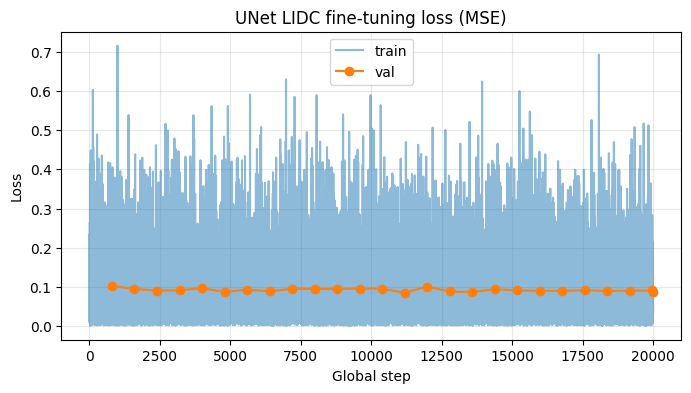

In [ ]:
torch.set_grad_enabled(True)

num_epochs       = 1000
checkpoint_steps = {2000, 4000, 6000, 8000, 12000, 16000, 20000}
global_step      = 0
grad_accum_steps = 4  # efektywny batch = 2*4 = 8

unet.train()

loss_history      = []
step_history      = []
val_loss_history  = []
val_step_history  = []

for epoch in range(num_epochs):
    loop = tqdm(train_dataloader, desc=f"Epoch {epoch+1}")
    optimizer.zero_grad()

    for step_in_epoch, batch in enumerate(loop):
        if global_step >= max_train_steps:
            break

        pixel_values = batch["pixel_values"].to(device, dtype=torch.float32)
        prompts      = batch["prompt"]

        with torch.no_grad():
            latents = vae.encode(pixel_values).latent_dist.sample() * 0.18215

        noise = torch.randn_like(latents)
        bsz   = latents.shape[0]

        timesteps = torch.randint(
            0,
            noise_scheduler.config.num_train_timesteps,
            (bsz,),
            device=device,
            dtype=torch.long,
        )

        noisy_latents = noise_scheduler.add_noise(latents, noise, timesteps)

        text_inputs = tokenizer(
            list(prompts),
            padding="max_length",
            max_length=tokenizer.model_max_length,
            truncation=True,
            return_tensors="pt",
        )
        input_ids = text_inputs.input_ids.to(device)

        with torch.no_grad():
            encoder_hidden_states = text_encoder(input_ids)[0]

        noise_pred = unet(
            noisy_latents,
            timesteps,
            encoder_hidden_states,
        ).sample

        loss = nn.functional.mse_loss(noise_pred, noise)
        if not torch.isfinite(loss):
            print("Non-finite loss, przerywam.")
            raise RuntimeError("Non-finite loss")

        loss_val = float(loss.item())
        loss = loss / grad_accum_steps
        loss.backward()

        if (step_in_epoch + 1) % grad_accum_steps == 0 or (step_in_epoch + 1) == len(train_dataloader):
            torch.nn.utils.clip_grad_norm_(trainable_params, 1.0)
            optimizer.step()
            scheduler.step()
            optimizer.zero_grad()

            global_step += 1
            loss_history.append(loss_val)
            step_history.append(global_step)

            loop.set_postfix({
                "loss": f"{loss_val:.4f}",
                "step": global_step,
                "lr": f"{scheduler.get_last_lr()[0]:.2e}",
            })

            if global_step in checkpoint_steps:
                save_unet_checkpoint(unet, global_step)

    # ---- walidacja po każdej epoce ----
    unet.eval()
    val_losses = []
    with torch.no_grad():
        for batch in val_dataloader:
            pixel_values = batch["pixel_values"].to(device, dtype=torch.float32)
            prompts      = batch["prompt"]

            latents = vae.encode(pixel_values).latent_dist.sample() * 0.18215
            noise   = torch.randn_like(latents)
            bsz     = latents.shape[0]

            timesteps = torch.randint(
                0,
                noise_scheduler.config.num_train_timesteps,
                (bsz,),
                device=device,
                dtype=torch.long,
            )

            noisy_latents = noise_scheduler.add_noise(latents, noise, timesteps)

            text_inputs = tokenizer(
                list(prompts),
                padding="max_length",
                max_length=tokenizer.model_max_length,
                truncation=True,
                return_tensors="pt",
            )
            input_ids = text_inputs.input_ids.to(device)
            encoder_hidden_states = text_encoder(input_ids)[0]

            noise_pred = unet(
                noisy_latents,
                timesteps,
                encoder_hidden_states,
            ).sample

            val_loss = nn.functional.mse_loss(noise_pred, noise)
            val_losses.append(float(val_loss.item()))

    mean_val_loss = float(np.mean(val_losses))
    val_loss_history.append(mean_val_loss)
    val_step_history.append(global_step)
    print(f"[VAL] Epoch {epoch+1}, step {global_step}, val_loss={mean_val_loss:.4f}")

    unet.train()

    if global_step >= max_train_steps:
        break

print("Trening zakończony, kroków:", global_step)
save_unet_checkpoint(unet, global_step)

plt.figure(figsize=(8,4))
plt.plot(step_history, loss_history, alpha=0.5, label="train")
plt.plot(val_step_history, val_loss_history, marker="o", label="val")
plt.title("UNet LIDC fine-tuning loss (MSE)")
plt.xlabel("Global step")
plt.ylabel("Loss")
plt.grid(True, alpha=0.3)
plt.legend()
plt.show()


Zapisano pipeline do: /content/drive/MyDrive/lidc_lora/sd15_ct_finetuned_unet_lidc_wide


Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

You have disabled the safety checker for <class 'diffusers.pipelines.stable_diffusion.pipeline_stable_diffusion.StableDiffusionPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .


  0%|          | 0/60 [00:00<?, ?it/s]

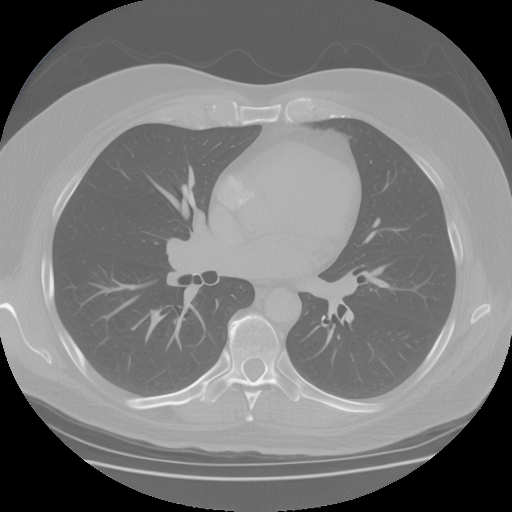

In [ ]:
pipe.save_pretrained(SAVE_DIR)
print("Zapisano pipeline do:", SAVE_DIR)

from IPython.display import display

pipe_ct = StableDiffusionPipeline.from_pretrained(
    SAVE_DIR,
    torch_dtype=torch.float16 if device=="cuda" else torch.float32,
    safety_checker=None,
).to(device)

pipe_ct.scheduler = DDPMScheduler.from_config(pipe_ct.scheduler.config)

test_prompt = (
    "axial lung CT, single solid pulmonary nodule in the right lower lobe, "
    "high-resolution chest CT, realistic medical CT image"
)

with torch.autocast(device_type=device, dtype=torch.float16 if device=="cuda" else torch.float32):
    out = pipe_ct(
        test_prompt,
        num_inference_steps=60,
        guidance_scale=4.0,
    )

img = out.images[0]
display(img.resize((512, 512)))


In [ ]:
from skimage.metrics import peak_signal_noise_ratio, structural_similarity
from torchmetrics.image.fid import FrechetInceptionDistance

def load_ref_image(file_name, root, image_size=512):
    img_path = os.path.join(root, "image", file_name)
    img = Image.open(img_path).convert("RGB")
    img = img.resize((image_size, image_size))
    arr = np.array(img).astype(np.float32) / 255.0
    return arr  # (H,W,3) [0,1]

def pil_to_fid_chw(img: Image.Image, size: int = 299) -> torch.Tensor:
    img = img.convert("RGB").resize((size, size), Image.BILINEAR)
    arr = np.array(img)
    if arr.dtype != np.uint8:
        arr = np.clip(arr, 0, 255).astype(np.uint8)
    tensor = torch.from_numpy(arr).permute(2, 0, 1)
    return tensor

def evaluate_pipe_psnr_ssim_fid_streaming(
    pipe,
    eval_df,
    lidc_root,
    image_size=512,
    n_eval=200,
    seed=123,
    num_inference_steps=40,
    guidance_scale=4.0,
):
    pipe.to(device)
    pipe.enable_attention_slicing()

    fid_metric = FrechetInceptionDistance(
        feature=2048,
        normalize=False,
    ).to("cpu")

    sum_psnr = 0.0
    sum_ssim = 0.0
    count    = 0

    generator = torch.Generator(device=device).manual_seed(seed)

    if n_eval is None:
        subset = eval_df.reset_index(drop=True)
    else:
        subset = eval_df.iloc[:n_eval].reset_index(drop=True)

    for i, row in tqdm(subset.iterrows(), total=len(subset), desc="Ewaluacja"):
        file_name = row["file_name"]
        prompt    = row["prompt"]

        ref_np = load_ref_image(file_name, lidc_root, image_size=image_size)

        with torch.autocast(device_type=device, dtype=torch.float16 if device=="cuda" else torch.float32):
            out = pipe(
                prompt=prompt,
                num_inference_steps=num_inference_steps,
                guidance_scale=guidance_scale,
                generator=generator,
            )
        gen_img = out.images[0].resize((image_size, image_size)).convert("RGB")
        gen_np  = np.array(gen_img).astype(np.float32) / 255.0

        psnr_val = peak_signal_noise_ratio(ref_np, gen_np, data_range=1.0)
        ssim_val = structural_similarity(ref_np, gen_np, channel_axis=-1, data_range=1.0)

        sum_psnr += psnr_val
        sum_ssim += ssim_val
        count    += 1

        ref_pil_for_fid = Image.fromarray((ref_np * 255).astype(np.uint8))
        gen_pil_for_fid = gen_img

        ref_t = pil_to_fid_chw(ref_pil_for_fid, size=299).unsqueeze(0).to("cpu")
        gen_t = pil_to_fid_chw(gen_pil_for_fid, size=299).unsqueeze(0).to("cpu")

        fid_metric.update(ref_t, real=True)
        fid_metric.update(gen_t, real=False)

    avg_psnr = float(sum_psnr / count)
    avg_ssim = float(sum_ssim / count)
    fid_val  = float(fid_metric.compute().item())

    return avg_psnr, avg_ssim, fid_val


In [ ]:
from diffusers import StableDiffusionPipeline, DDPMScheduler

N_EVAL = 200  # albo None dla całego val

print(">>> Fine-tuned UNet (VAL) – ONLY")

pipe_ft = StableDiffusionPipeline.from_pretrained(
    SAVE_DIR,  # katalog z pipeline'em zapisanym po wgraniu unet_best.pt
    torch_dtype=torch.float16 if device == "cuda" else torch.float32,
    safety_checker=None,
).to(device)
pipe_ft.scheduler = DDPMScheduler.from_config(pipe_ft.scheduler.config)

psnr_ft, ssim_ft, fid_ft = evaluate_pipe_psnr_ssim_fid_streaming(
    pipe_ft,
    val_df,
    lidc_root=LIDC_ROOT,
    image_size=512,
    n_eval=N_EVAL,
    num_inference_steps=60,  # jak przy generacji CT
    guidance_scale=4.0,
)
print(f"Fine-tuned VAL - PSNR: {psnr_ft:.4f} dB, SSIM: {ssim_ft:.4f}, FID: {fid_ft:.4f}")

metrics_df = pd.DataFrame([
    {"model": "sd15_lidc_ft_wide_val", "psnr": psnr_ft, "ssim": ssim_ft, "fid": fid_ft},
])
metrics_df


>>> Fine-tuned UNet (VAL) – ONLY


Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

You have disabled the safety checker for <class 'diffusers.pipelines.stable_diffusion.pipeline_stable_diffusion.StableDiffusionPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .
Downloading: "https://github.com/toshas/torch-fidelity/releases/download/v0.2.0/weights-inception-2015-12-05-6726825d.pth" to /root/.cache/torch/hub/checkpoints/weights-inception-2015-12-05-6726825d.pth
100%|██████████| 91.2M/91.2M [00:00<00:00, 304MB/s]


Ewaluacja:   0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

Fine-tuned VAL - PSNR: 10.3910 dB, SSIM: 0.3086, FID: 89.7047


,model,psnr,ssim,fid
0,sd15_lidc_ft_wide_val,10.390955,0.308579,89.704735


In [11]:
import os
import numpy as np
import pandas as pd
from PIL import Image

import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from tqdm.auto import tqdm
import matplotlib.pyplot as plt

from google.colab import drive
drive.mount('/content/drive')

device = "cuda" if torch.cuda.is_available() else "cpu"
print("Device:", device)

# --- ścieżki LIDC ---
LIDC_ROOT = "/content/drive/MyDrive/lidc_lora/LIDC"
IMAGES_DIR = os.path.join(LIDC_ROOT, "image")
MASK_DIR   = os.path.join(LIDC_ROOT, "mask")

CSV_PATH   = os.path.join(LIDC_ROOT, "captions_lidc_lora.csv")
print("CSV:", CSV_PATH, os.path.exists(CSV_PATH))
print("IMG DIR:", IMAGES_DIR, os.path.exists(IMAGES_DIR))
print("MASK DIR:", MASK_DIR,   os.path.exists(MASK_DIR))

# --- katalogi eksperymentu ---
EXP_ROOT = "/content/drive/MyDrive/lidc_lora"
SAVE_DIR = os.path.join(EXP_ROOT, "sd15_ct_finetuned_unet_lidc")  # już istniejący FT model
CN_SAVE_DIR = os.path.join(EXP_ROOT, "sd15_ct_finetuned_unet_lidc_controlnet_mask")
os.makedirs(CN_SAVE_DIR, exist_ok=True)

# --- wczytanie CSV i podział train/val (tak jak wcześniej) ---
full_df = pd.read_csv(CSV_PATH)
print("Liczba wszystkich próbek:", len(full_df))

full_df = full_df.sample(frac=1.0, random_state=42).reset_index(drop=True)
split_idx = int(0.85 * len(full_df))

train_df = full_df.iloc[:split_idx].reset_index(drop=True)
val_df   = full_df.iloc[split_idx:].reset_index(drop=True)

print("Train:", len(train_df), "Val:", len(val_df))


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Device: cuda
CSV: /content/drive/MyDrive/lidc_lora/LIDC/captions_lidc_lora.csv True
IMG DIR: /content/drive/MyDrive/lidc_lora/LIDC/image True
MASK DIR: /content/drive/MyDrive/lidc_lora/LIDC/mask True
Liczba wszystkich próbek: 7521
Train: 6392 Val: 1129


In [12]:
import re
from torch.utils.data import Dataset
from torchvision import transforms
from PIL import Image
import os

class LIDCLungCTMaskControlDataset(Dataset):
    def __init__(self, df, image_root, mask_root, resolution=512):
        self.image_root = image_root
        self.mask_root  = mask_root

        self.img_transform = transforms.Compose([
            transforms.Resize((resolution, resolution)),
            transforms.ToTensor(),
            transforms.Normalize([0.5]*3, [0.5]*3),   # [-1,1]
        ])
        self.mask_transform = transforms.Compose([
            transforms.Resize((resolution, resolution), interpolation=Image.NEAREST),
            transforms.ToTensor(),                    # [0,1]
        ])

        self.samples = []
        for _, row in df.iterrows():
            img_fname = row["file_name"]          # np. LIDC_2338.png
            img_path  = os.path.join(image_root, img_fname)

            base, ext = os.path.splitext(img_fname)
            # wyciągamy ID liczbowy z nazwy LIDC_2338 -> 2338
            m = re.findall(r"\d+", base)
            if not m:
                continue
            case_id = m[-1]

            # odpowiadająca maska: LIDC_Mask_2338.png
            mask_fname = f"LIDC_Mask_{case_id}.png"
            mask_path  = os.path.join(mask_root, mask_fname)

            if os.path.exists(img_path) and os.path.exists(mask_path):
                self.samples.append({
                    "img_path": img_path,
                    "mask_path": mask_path,
                    "prompt": row["prompt"],
                    "file_name": img_fname,
                })

        print(f"[MaskDataset] Po dopasowaniu par CT+mask: {len(self.samples)} próbek")

    def __len__(self):
        return len(self.samples)

    def __getitem__(self, idx):
        item = self.samples[idx]

        # CT
        image = Image.open(item["img_path"]).convert("RGB")
        image = self.img_transform(image)

        # maska guza (binary 0/1 -> [-1,1] i 3 kanały)
        mask = Image.open(item["mask_path"]).convert("L")
        mask = self.mask_transform(mask)              # (1,H,W), [0,1]
        if mask.shape[0] == 1:
            mask = mask.repeat(3, 1, 1)              # (3,H,W)
        mask = mask * 2.0 - 1.0                       # [-1,1]

        return {
            "pixel_values":  image,
            "control_image": mask,
            "prompt":        item["prompt"],
            "file_name":     item["file_name"],
        }


In [13]:
MASK_DIR = "/content/drive/MyDrive/lidc_lora/LIDC/mask"

control_train_dataset = LIDCLungCTMaskControlDataset(train_df, IMAGES_DIR, MASK_DIR, resolution=512)
control_val_dataset   = LIDCLungCTMaskControlDataset(val_df,   IMAGES_DIR, MASK_DIR, resolution=512)

control_batch_size    = 2
control_train_loader  = DataLoader(control_train_dataset, batch_size=control_batch_size,
                                   shuffle=True,  num_workers=2)
control_val_loader    = DataLoader(control_val_dataset,   batch_size=control_batch_size,
                                   shuffle=False, num_workers=2)

print("ControlNet train:", len(control_train_dataset), "val:", len(control_val_dataset))


[MaskDataset] Po dopasowaniu par CT+mask: 6392 próbek
[MaskDataset] Po dopasowaniu par CT+mask: 1129 próbek
ControlNet train: 6392 val: 1129


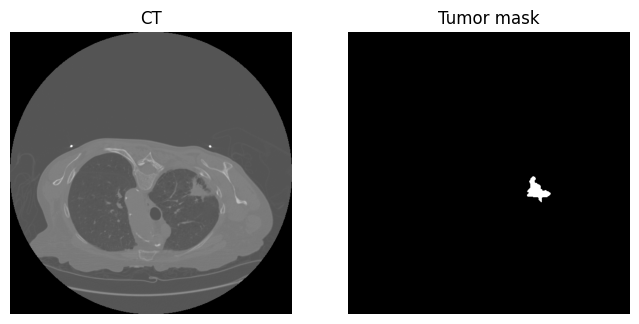

In [10]:
sample = control_train_dataset[0]

ct_vis   = sample["pixel_values"].permute(1,2,0).numpy()
ct_vis   = (ct_vis * 0.5 + 0.5).clip(0,1)

mask_vis = sample["control_image"][0].numpy()        # bierzemy 1 kanał
mask_vis = ((mask_vis + 1.0)/2.0).clip(0,1)

plt.figure(figsize=(8,4))
plt.subplot(1,2,1); plt.imshow(ct_vis,   cmap="gray"); plt.title("CT");   plt.axis("off")
plt.subplot(1,2,2); plt.imshow(mask_vis, cmap="gray"); plt.title("Tumor mask"); plt.axis("off")
plt.show()


In [11]:
from diffusers import ControlNetModel, StableDiffusionControlNetPipeline, DDPMScheduler
import torch
import torch.nn as nn
from tqdm.auto import tqdm

device = "cuda" if torch.cuda.is_available() else "cpu"
print("Device:", device)

# 1) baza: Twój fine-tuned pipeline UNet+VAE+tekst
SAVE_DIR_UNET = "/content/drive/MyDrive/lidc_lora/sd15_ct_finetuned_unet_lidc"

base_pipe = StableDiffusionPipeline.from_pretrained(
    SAVE_DIR_UNET,
    torch_dtype=torch.float32,   # trening w fp32
    safety_checker=None,
).to(device)

# 2) ControlNet startujemy z canny (ma sens do krawędzi/masek)
controlnet = ControlNetModel.from_pretrained(
    "lllyasviel/sd-controlnet-canny",
    torch_dtype=torch.float32,
)

# 3) składamy pipeline SD + ControlNet
cn_pipe = StableDiffusionControlNetPipeline(
    vae=base_pipe.vae,
    text_encoder=base_pipe.text_encoder,
    tokenizer=base_pipe.tokenizer,
    unet=base_pipe.unet,
    controlnet=controlnet,
    scheduler=DDPMScheduler.from_config(base_pipe.scheduler.config),
    safety_checker=None,
    feature_extractor=None,
).to(device)

# 4) zamrażamy wszystko oprócz ControlNetu
cn_pipe.vae.requires_grad_(False)
cn_pipe.text_encoder.requires_grad_(False)
cn_pipe.unet.requires_grad_(False)
controlnet.requires_grad_(True)

cn_trainable_params = [p for p in controlnet.parameters() if p.requires_grad]
print("ControlNet trainable params:", sum(p.numel() for p in cn_trainable_params))

# 5) optymalizator + scheduler
cn_learning_rate = 5e-6
cn_optimizer = torch.optim.AdamW(
    cn_trainable_params,
    lr=cn_learning_rate,
    betas=(0.9, 0.999),
    weight_decay=1e-2,
)

cn_max_steps   = 5000         # docelowa liczba "global steps"
cn_grad_accum  = 4            # efektywny batch = control_batch_size * cn_grad_accum
cn_scheduler   = torch.optim.lr_scheduler.CosineAnnealingLR(
    cn_optimizer,
    T_max=cn_max_steps,
    eta_min=1e-6,
)

cn_noise_scheduler = cn_pipe.scheduler

CN_SAVE_DIR = "/content/drive/MyDrive/lidc_lora/sd15_ct_finetuned_unet_lidc_controlnet_mask"
os.makedirs(CN_SAVE_DIR, exist_ok=True)


Device: cuda


Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

You have disabled the safety checker for <class 'diffusers.pipelines.stable_diffusion.pipeline_stable_diffusion.StableDiffusionPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .
/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be ab

config.json:   0%|          | 0.00/920 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/1.45G [00:00<?, ?B/s]

You have disabled the safety checker for <class 'diffusers.pipelines.controlnet.pipeline_controlnet.StableDiffusionControlNetPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .


ControlNet trainable params: 361279120


In [12]:
torch.set_grad_enabled(True)

cn_global_step = 0
controlnet.train()   # UWAGA: wywołujemy .train() NA MODELU, nie na pipeline

cn_loss_history = []

for epoch in range(100):  # górny limit epok – realnie zatrzyma się na cn_max_steps
    loop = tqdm(control_train_loader, desc=f"ControlNet epoch {epoch+1}")
    cn_optimizer.zero_grad()

    for step_in_epoch, batch in enumerate(loop):
        if cn_global_step >= cn_max_steps:
            break

        pixel_values  = batch["pixel_values"].to(device, dtype=torch.float32)   # [-1,1]
        control_image = batch["control_image"].to(device, dtype=torch.float32)  # [-1,1], 3xHxW
        prompts       = batch["prompt"]

        # 1) CT -> latents
        with torch.no_grad():
            latents = cn_pipe.vae.encode(pixel_values).latent_dist.sample() * 0.18215

        # 2) szum + timesteps
        noise = torch.randn_like(latents)
        bsz   = latents.shape[0]

        timesteps = torch.randint(
            0,
            cn_noise_scheduler.config.num_train_timesteps,
            (bsz,),
            device=device,
            dtype=torch.long,
        )

        noisy_latents = cn_noise_scheduler.add_noise(latents, noise, timesteps)

        # 3) tekst -> embeddingi
        text_inputs = cn_pipe.tokenizer(
            list(prompts),
            padding="max_length",
            max_length=cn_pipe.tokenizer.model_max_length,
            truncation=True,
            return_tensors="pt",
        )
        input_ids = text_inputs.input_ids.to(device)
        with torch.no_grad():
            encoder_hidden_states = cn_pipe.text_encoder(input_ids)[0]

        # 4) forward ControlNet + UNet
        down_samples, mid_sample = controlnet(
            noisy_latents,
            timesteps,
            encoder_hidden_states=encoder_hidden_states,
            controlnet_cond=control_image,
            return_dict=False,
        )

        noise_pred = cn_pipe.unet(
            noisy_latents,
            timesteps,
            encoder_hidden_states,
            down_block_additional_residuals=down_samples,
            mid_block_additional_residual=mid_sample,
        ).sample

        loss = nn.functional.mse_loss(noise_pred, noise)
        loss_val = float(loss.item())
        cn_loss_history.append(loss_val)

        loss = loss / cn_grad_accum
        loss.backward()

        # krok optymalizacji co cn_grad_accum batchy
        if ((step_in_epoch + 1) % cn_grad_accum == 0) or ((step_in_epoch + 1) == len(control_train_loader)):
            torch.nn.utils.clip_grad_norm_(cn_trainable_params, 1.0)
            cn_optimizer.step()
            cn_scheduler.step()
            cn_optimizer.zero_grad()

            cn_global_step += 1

            loop.set_postfix({
                "loss": f"{loss_val:.4f}",
                "step": cn_global_step,
                "lr": f"{cn_scheduler.get_last_lr()[0]:.2e}",
            })

    if cn_global_step >= cn_max_steps:
        break

print("ControlNet trening zakończony na kroku:", cn_global_step)


ControlNet epoch 1:   0%|          | 0/3196 [00:00<?, ?it/s]

ControlNet epoch 2:   0%|          | 0/3196 [00:00<?, ?it/s]

ControlNet epoch 3:   0%|          | 0/3196 [00:00<?, ?it/s]

ControlNet epoch 4:   0%|          | 0/3196 [00:00<?, ?it/s]

ControlNet epoch 5:   0%|          | 0/3196 [00:00<?, ?it/s]

ControlNet epoch 6:   0%|          | 0/3196 [00:00<?, ?it/s]

ControlNet epoch 7:   0%|          | 0/3196 [00:00<?, ?it/s]

ControlNet trening zakończony na kroku: 5000


In [13]:
# zapisujemy cały pipeline (UNet już wytrenowany, ControlNet dopasowany na maskach)
cn_pipe.save_pretrained(CN_SAVE_DIR)
print("Zapisano pipeline ControlNet+FT do:", CN_SAVE_DIR)


Zapisano pipeline ControlNet+FT do: /content/drive/MyDrive/lidc_lora/sd15_ct_finetuned_unet_lidc_controlnet_mask


Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

You have disabled the safety checker for <class 'diffusers.pipelines.stable_diffusion.pipeline_stable_diffusion.StableDiffusionPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .


Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

You have disabled the safety checker for <class 'diffusers.pipelines.controlnet.pipeline_controlnet.StableDiffusionControlNetPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .


  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

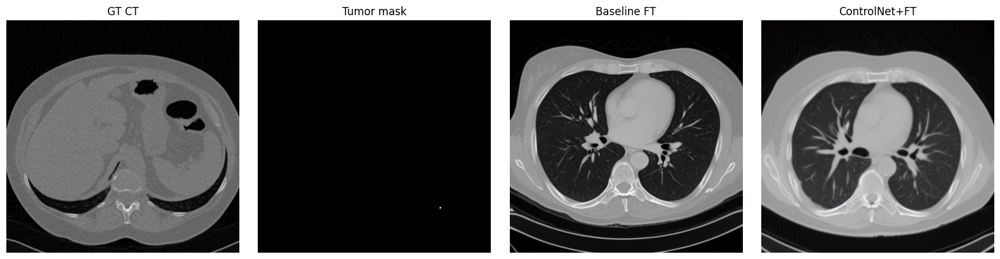

In [14]:
from diffusers import StableDiffusionControlNetPipeline

# 1) pipeline bazowy (bez ControlNetu) – ten sam co wcześniej
pipe_ft = StableDiffusionPipeline.from_pretrained(
    SAVE_DIR_UNET,
    torch_dtype=torch.float16 if device=="cuda" else torch.float32,
    safety_checker=None,
).to(device)
pipe_ft.scheduler = DDPMScheduler.from_config(pipe_ft.scheduler.config)

# 2) pipeline z ControlNetem na maskach
pipe_cn = StableDiffusionControlNetPipeline.from_pretrained(
    CN_SAVE_DIR,
    torch_dtype=torch.float16 if device=="cuda" else torch.float32,
    safety_checker=None,
).to(device)
pipe_cn.scheduler = DDPMScheduler.from_config(pipe_cn.scheduler.config)

# próbka z walidacji
sample_row = control_val_dataset[0]  # już ma CT + maskę + prompt
gt_path = os.path.join(IMAGES_DIR, sample_row["file_name"])
gt_ct   = Image.open(gt_path).convert("RGB").resize((512,512))

mask_img = sample_row["control_image"][0].cpu().numpy()  # 1 kanał z [-1,1]
mask_vis = ((mask_img + 1.0)/2.0 * 255).astype("uint8")
mask_vis = Image.fromarray(mask_vis).resize((512,512))

prompt = sample_row["prompt"]

with torch.autocast(device_type=device, dtype=torch.float16 if device=="cuda" else torch.float32):
    out_base = pipe_ft(
        prompt=prompt,
        num_inference_steps=60,
        guidance_scale=4.0,
    )
    img_base = out_base.images[0].resize((512,512))

    out_cn = pipe_cn(
        prompt=prompt,
        image=mask_vis,          # UWAGA: tu PIL maski (0..255), pipeline sam znormalizuje
        num_inference_steps=60,
        guidance_scale=4.0,
        controlnet_conditioning_scale=1.0,
    )
    img_cn = out_cn.images[0].resize((512,512))

plt.figure(figsize=(16,4))
plt.subplot(1,4,1); plt.imshow(gt_ct,   cmap="gray"); plt.title("GT CT");         plt.axis("off")
plt.subplot(1,4,2); plt.imshow(mask_vis, cmap="gray"); plt.title("Tumor mask");   plt.axis("off")
plt.subplot(1,4,3); plt.imshow(img_base, cmap="gray"); plt.title("Baseline FT");  plt.axis("off")
plt.subplot(1,4,4); plt.imshow(img_cn,   cmap="gray"); plt.title("ControlNet+FT");plt.axis("off")
plt.tight_layout()
plt.show()


In [1]:
import os
import numpy as np
import pandas as pd
from PIL import Image
import matplotlib.pyplot as plt
import torch
from diffusers import StableDiffusionPipeline, StableDiffusionControlNetPipeline, DDPMScheduler

device = "cuda" if torch.cuda.is_available() else "cpu"
print("Device:", device)

# ----------------- ŚCIEŻKI -----------------
LIDC_ROOT   = "/content/drive/MyDrive/lidc_lora/LIDC"
IMAGES_DIR  = os.path.join(LIDC_ROOT, "image")
MASK_DIR    = os.path.join(LIDC_ROOT, "mask")
CSV_PATH    = os.path.join(LIDC_ROOT, "captions_lidc_lora.csv")

SAVE_DIR    = "/content/drive/MyDrive/lidc_lora/sd15_ct_finetuned_unet_lidc"
CN_SAVE_DIR = "/content/drive/MyDrive/lidc_lora/sd15_ct_finetuned_unet_lidc_controlnet_tumor"

# ----------------- CSV i val_df -----------------
full_df = pd.read_csv(CSV_PATH)
full_df = full_df.sample(frac=1.0, random_state=42).reset_index(drop=True)
split_idx = int(0.85 * len(full_df))
train_df  = full_df.iloc[:split_idx].reset_index(drop=True)
val_df    = full_df.iloc[split_idx:].reset_index(drop=True)

print("Train:", len(train_df), "Val:", len(val_df))

# ----------------- pomocnicze funkcje -----------------
def file_to_mask_name(fname: str) -> str:
    """LIDC_2338.png -> LIDC_Mask_2338.png"""
    base = os.path.splitext(fname)[0]          # LIDC_2338
    suffix = base.split("_", 1)[1]             # 2338
    return f"LIDC_Mask_{suffix}.png"

def load_ct(fname, image_size=512):
    path = os.path.join(IMAGES_DIR, fname)
    img = Image.open(path).convert("RGB").resize((image_size, image_size))
    return img

def load_mask(fname, image_size=512):
    mask_name = file_to_mask_name(fname)
    path = os.path.join(MASK_DIR, mask_name)
    img = Image.open(path).convert("L").resize((image_size, image_size))
    return img

def mask_area_fraction(fname, thr=0.5):
    """Ułamek pikseli maski > thr (po normalizacji do [0,1])."""
    m = load_mask(fname, image_size=512)
    arr = np.array(m).astype(np.float32) / 255.0
    return float((arr > thr).mean())

def show_four_panel(gt_ct, cond, base_img, cn_img, titles=None, figsize=(16,4)):
    if titles is None:
        titles = ["GT CT", "Condition", "Baseline FT", "ControlNet+FT"]
    fig, axs = plt.subplots(1, 4, figsize=figsize)
    axs[0].imshow(gt_ct, cmap="gray")
    axs[0].set_title(titles[0]); axs[0].axis("off")
    axs[1].imshow(cond, cmap="gray")
    axs[1].set_title(titles[1]); axs[1].axis("off")
    axs[2].imshow(base_img, cmap="gray")
    axs[2].set_title(titles[2]); axs[2].axis("off")
    axs[3].imshow(cn_img, cmap="gray")
    axs[3].set_title(titles[3]); axs[3].axis("off")
    plt.tight_layout()
    plt.show()


Device: cuda
Train: 6392 Val: 1129


In [4]:
# ---- pipeline FT (bez ControlNeta) ----
pipe_ft = StableDiffusionPipeline.from_pretrained(
    SAVE_DIR,
    torch_dtype=torch.float16 if device=="cuda" else torch.float32,
    safety_checker=None,
).to(device)
pipe_ft.scheduler = DDPMScheduler.from_config(pipe_ft.scheduler.config)

# ---- pipeline z ControlNet (UNet ten sam co FT) ----
pipe_cn = StableDiffusionControlNetPipeline.from_pretrained(
    CN_SAVE_DIR,
    torch_dtype=torch.float16 if device=="cuda" else torch.float32,
    safety_checker=None,
).to(device)
pipe_cn.scheduler = DDPMScheduler.from_config(pipe_cn.scheduler.config)

pipe_ft.enable_attention_slicing()
pipe_cn.enable_attention_slicing()

print("Pipelines załadowane.")


Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

You have disabled the safety checker for <class 'diffusers.pipelines.stable_diffusion.pipeline_stable_diffusion.StableDiffusionPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .


Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

You have disabled the safety checker for <class 'diffusers.pipelines.controlnet.pipeline_controlnet.StableDiffusionControlNetPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .


Pipelines załadowane.


VAL z większą maską: 500


  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]


Próbka 1 – LIDC_6877.png, mask_frac=0.00309


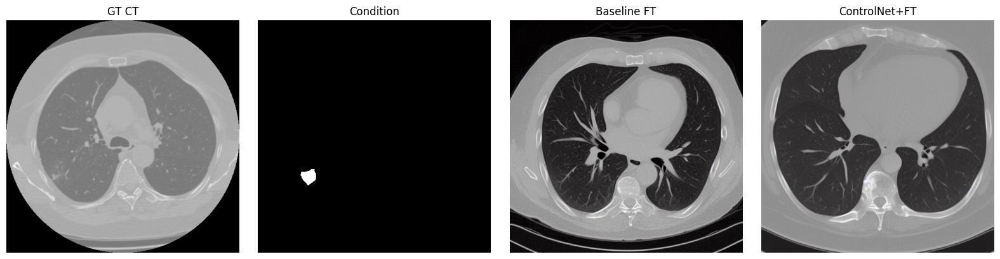

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]


Próbka 2 – LIDC_2397.png, mask_frac=0.00092


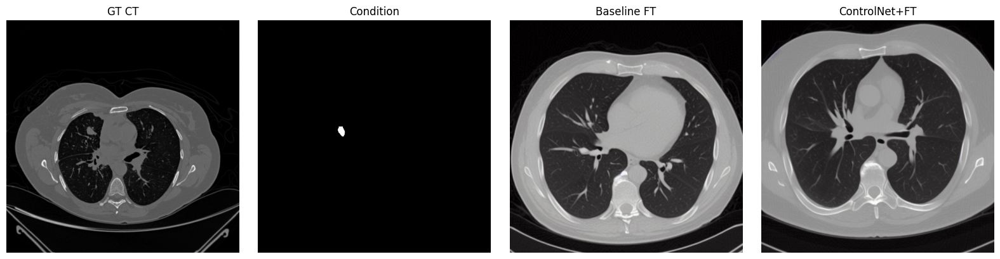

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]


Próbka 3 – LIDC_3517.png, mask_frac=0.00236


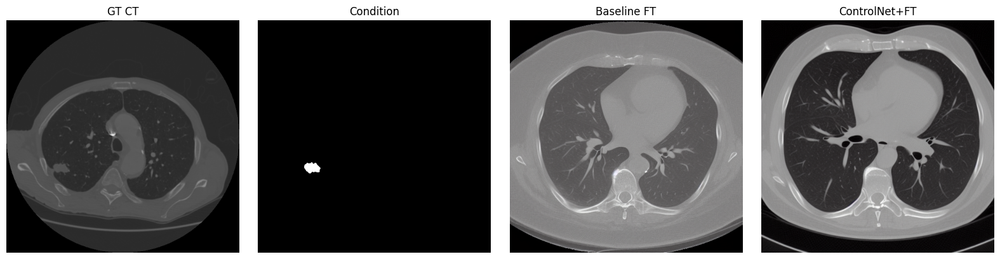

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]


Próbka 4 – LIDC_3421.png, mask_frac=0.00061


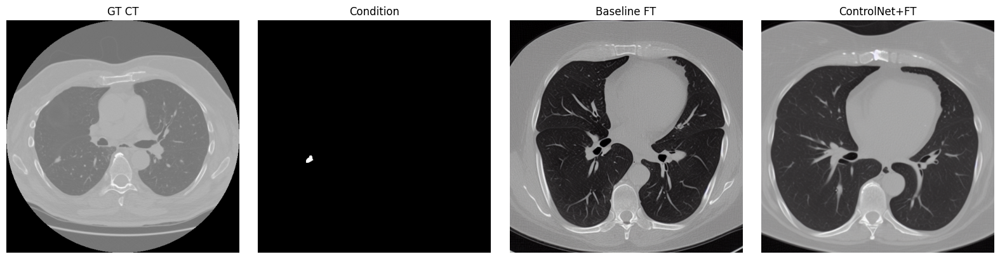

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]


Próbka 5 – LIDC_1975.png, mask_frac=0.00065


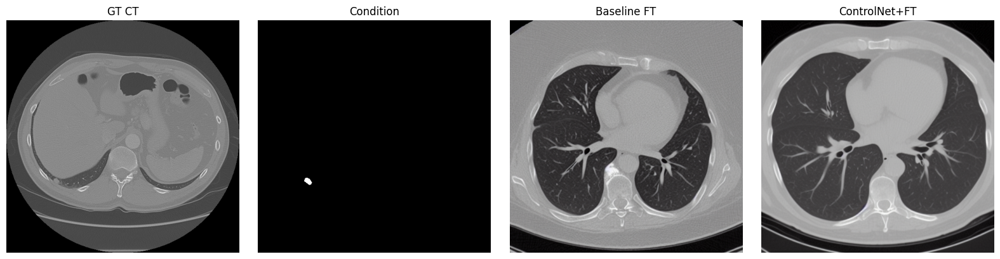

In [5]:
# wybierz próbki z większą maską
fractions = []
for i, row in val_df.iterrows():
    fname = row["file_name"]
    try:
        frac = mask_area_fraction(fname, thr=0.5)
    except FileNotFoundError:
        frac = 0.0
    fractions.append(frac)

val_df["mask_frac"] = fractions
big_df = val_df[val_df["mask_frac"] > 0.0005].reset_index(drop=True)  # próg możesz podnieść/obniżyć
print("VAL z większą maską:", len(big_df))

# jeśli mało próbek, weź wszystkie; inaczej np. 5
n_show = min(5, len(big_df))

generator = torch.Generator(device=device).manual_seed(123)

for idx in range(n_show):
    row = big_df.iloc[idx]
    fname  = row["file_name"]
    prompt = row["prompt"]

    ct_img   = load_ct(fname, image_size=512)
    mask_img = load_mask(fname, image_size=512)

    # baseline FT
    with torch.autocast(device_type=device, dtype=torch.float16 if device=="cuda" else torch.float32):
        out_base = pipe_ft(
            prompt,
            num_inference_steps=60,
            guidance_scale=4.0,
            generator=generator,
        )
    base_img = out_base.images[0].resize((512,512))

    # ControlNet: ta sama maska jako image
    with torch.autocast(device_type=device, dtype=torch.float16 if device=="cuda" else torch.float32):
        out_cn = pipe_cn(
            prompt=prompt,
            image=mask_img,     # maska guza
            num_inference_steps=60,
            guidance_scale=4.0,
            generator=generator,
        )
    cn_img = out_cn.images[0].resize((512,512))

    print(f"\nPróbka {idx+1} – {fname}, mask_frac={row['mask_frac']:.5f}")
    show_four_panel(ct_img, mask_img, base_img, cn_img)


Test shuffle – porównanie maski poprawnej vs obcej


  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]


Próbka 1: prompt z LIDC_6877.png, maska poprawna=LIDC_6877.png, maska obca=LIDC_2397.png


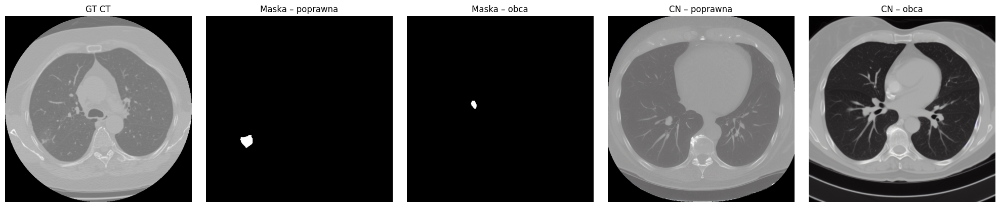

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]


Próbka 2: prompt z LIDC_2397.png, maska poprawna=LIDC_2397.png, maska obca=LIDC_3517.png


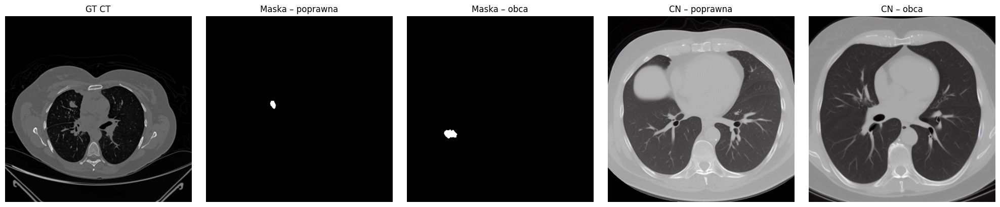

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]


Próbka 3: prompt z LIDC_3517.png, maska poprawna=LIDC_3517.png, maska obca=LIDC_6877.png


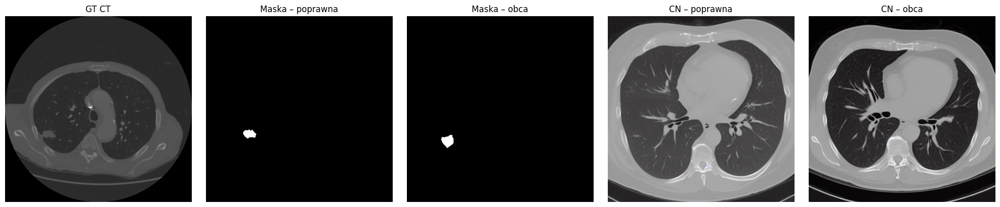

In [6]:
# użyj tych samych próbek big_df
if len(big_df) >= 3:
    k = min(3, len(big_df))
else:
    k = len(big_df)

# weź pierwsze k próbek i „przesuń” maski o 1 w dół
print("Test shuffle – porównanie maski poprawnej vs obcej")

generator = torch.Generator(device=device).manual_seed(456)

for i in range(k):
    row = big_df.iloc[i]
    j   = (i + 1) % k                # indeks "obcej" maski
    row_wrong = big_df.iloc[j]

    fname       = row["file_name"]
    prompt      = row["prompt"]
    fname_wrong = row_wrong["file_name"]

    ct_img      = load_ct(fname, image_size=512)
    mask_true   = load_mask(fname, image_size=512)
    mask_wrong  = load_mask(fname_wrong, image_size=512)

    # FT baseline – tylko prompt
    with torch.autocast(device_type=device, dtype=torch.float16 if device=="cuda" else torch.float32):
        out_base = pipe_ft(
            prompt,
            num_inference_steps=60,
            guidance_scale=4.0,
            generator=generator,
        )
    base_img = out_base.images[0].resize((512,512))

    # CN z prawidłową maską
    with torch.autocast(device_type=device, dtype=torch.float16 if device=="cuda" else torch.float32):
        out_cn_true = pipe_cn(
            prompt=prompt,
            image=mask_true,
            num_inference_steps=60,
            guidance_scale=4.0,
            generator=generator,
        )
    cn_true_img = out_cn_true.images[0].resize((512,512))

    # CN z „obcą” maską
    with torch.autocast(device_type=device, dtype=torch.float16 if device=="cuda" else torch.float32):
        out_cn_wrong = pipe_cn(
            prompt=prompt,
            image=mask_wrong,
            num_inference_steps=60,
            guidance_scale=4.0,
            generator=generator,
        )
    cn_wrong_img = out_cn_wrong.images[0].resize((512,512))

    print(f"\nPróbka {i+1}: prompt z {fname}, maska poprawna={fname}, maska obca={fname_wrong}")
    fig, axs = plt.subplots(1, 5, figsize=(20,4))
    axs[0].imshow(ct_img, cmap="gray");       axs[0].set_title("GT CT"); axs[0].axis("off")
    axs[1].imshow(mask_true, cmap="gray");    axs[1].set_title("Maska – poprawna"); axs[1].axis("off")
    axs[2].imshow(mask_wrong, cmap="gray");   axs[2].set_title("Maska – obca"); axs[2].axis("off")
    axs[3].imshow(cn_true_img, cmap="gray");  axs[3].set_title("CN – poprawna"); axs[3].axis("off")
    axs[4].imshow(cn_wrong_img, cmap="gray"); axs[4].set_title("CN – obca"); axs[4].axis("off")
    plt.tight_layout()
    plt.show()


  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

Test wielu seedów – ta sama maska i prompt


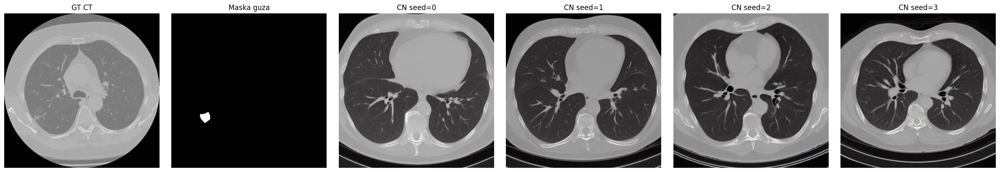

In [7]:
# wybierz jedną próbkę z większą maską
if len(big_df) == 0:
    raise RuntimeError("big_df jest puste – podnieś próg mask_frac albo sprawdź maski.")

row = big_df.iloc[0]
fname  = row["file_name"]
prompt = row["prompt"]

ct_img   = load_ct(fname, image_size=512)
mask_img = load_mask(fname, image_size=512)

seeds = [0, 1, 2, 3]

gen_imgs = []
for s in seeds:
    gen = torch.Generator(device=device).manual_seed(s)
    with torch.autocast(device_type=device, dtype=torch.float16 if device=="cuda" else torch.float32):
        out = pipe_cn(
            prompt=prompt,
            image=mask_img,
            num_inference_steps=60,
            guidance_scale=4.0,
            generator=gen,
        )
    gen_imgs.append(out.images[0].resize((512,512)))

print("Test wielu seedów – ta sama maska i prompt")

fig, axs = plt.subplots(1, len(seeds)+2, figsize=(4*(len(seeds)+2), 4))
axs[0].imshow(ct_img, cmap="gray");   axs[0].set_title("GT CT"); axs[0].axis("off")
axs[1].imshow(mask_img, cmap="gray"); axs[1].set_title("Maska guza"); axs[1].axis("off")

for k, img in enumerate(gen_imgs):
    axs[2+k].imshow(img, cmap="gray")
    axs[2+k].set_title(f"CN seed={seeds[k]}")
    axs[2+k].axis("off")

plt.tight_layout()
plt.show()


In [8]:
import os
import numpy as np
import pandas as pd
from PIL import Image
from tqdm.auto import tqdm

import torch
from skimage.metrics import peak_signal_noise_ratio, structural_similarity
from torchmetrics.image.fid import FrechetInceptionDistance

from diffusers import StableDiffusionControlNetPipeline, DDPMScheduler

device = "cuda" if torch.cuda.is_available() else "cpu"
print("Device:", device)

# Ścieżki – dostosuj tylko jak masz inaczej
LIDC_ROOT = "/content/drive/MyDrive/lidc_lora/LIDC"
IMAGES_DIR = os.path.join(LIDC_ROOT, "image")
MASK_DIR   = os.path.join(LIDC_ROOT, "mask")   # maski LIDC_Mask_xxxx.png

print("IMG dir:", IMAGES_DIR, os.path.exists(IMAGES_DIR))
print("MASK dir:", MASK_DIR, os.path.exists(MASK_DIR))


def load_ref_image(file_name, root, image_size=512):
    """
    GT CT slice do PSNR/SSIM (float [0,1], HxWx3)
    """
    img_path = os.path.join(root, "image", file_name)
    img = Image.open(img_path).convert("RGB")
    img = img.resize((image_size, image_size))
    arr = np.array(img).astype(np.float32) / 255.0
    return arr


def pil_to_fid_chw(img: Image.Image, size: int = 299) -> torch.Tensor:
    """
    PIL -> tensor uint8 (3,H,W) dla FID
    """
    img = img.convert("RGB").resize((size, size), Image.BILINEAR)
    arr = np.array(img)
    if arr.dtype != np.uint8:
        arr = np.clip(arr, 0, 255).astype(np.uint8)
    tensor = torch.from_numpy(arr).permute(2, 0, 1)  # (3,H,W)
    return tensor


Device: cuda
IMG dir: /content/drive/MyDrive/lidc_lora/LIDC/image True
MASK dir: /content/drive/MyDrive/lidc_lora/LIDC/mask True


In [9]:
def evaluate_controlnet_psnr_ssim_fid(
    pipe_cn,
    eval_df,
    lidc_root,
    mask_root,
    image_size=512,
    n_eval=150,                 # możesz zmienić na 200 / None
    num_inference_steps=60,
    guidance_scale=4.0,
    seed=123,
):
    """
    Ewaluacja ControlNet+FT:
    - PSNR, SSIM (średnie po próbkach)
    - FID (torchmetrics FrechetInceptionDistance, streamingowo)

    Uwaga: próbki bez maski są pomijane (np. brak pliku).
    """
    pipe_cn.to(device)
    pipe_cn.enable_attention_slicing()

    # FID na CPU, streamingowo
    fid_metric = FrechetInceptionDistance(
        feature=2048,
        normalize=False,
    ).to("cpu")

    sum_psnr = 0.0
    sum_ssim = 0.0
    count    = 0
    skipped  = 0

    if n_eval is None:
        subset = eval_df.reset_index(drop=True)
    else:
        subset = eval_df.iloc[:n_eval].reset_index(drop=True)

    generator = torch.Generator(device=device).manual_seed(seed)

    for _, row in tqdm(subset.iterrows(), total=len(subset), desc="Ewaluacja CN"):
        file_name = row["file_name"]
        prompt    = row["prompt"]

        # --- maska guza: LIDC_xxxx.png -> LIDC_Mask_xxxx.png ---
        base      = os.path.splitext(file_name)[0]   # np. "LIDC_7506"
        idx_part  = base.split("_")[-1]              # "7506"
        mask_name = f"LIDC_Mask_{idx_part}.png"
        mask_path = os.path.join(mask_root, mask_name)

        if not os.path.exists(mask_path):
            skipped += 1
            continue

        # GT CT
        ref_np = load_ref_image(file_name, lidc_root, image_size=image_size)

        # maska jako PIL
        cond_img = Image.open(mask_path).convert("RGB")
        cond_img = cond_img.resize((image_size, image_size), Image.NEAREST)

        # --- generacja ControlNet+FT ---
        with torch.autocast(
            device_type=device,
            dtype=torch.float16 if device == "cuda" else torch.float32
        ):
            out = pipe_cn(
                prompt=prompt,
                image=cond_img,
                num_inference_steps=num_inference_steps,
                guidance_scale=guidance_scale,
                generator=generator,
            )
        gen_img = out.images[0].resize((image_size, image_size)).convert("RGB")
        gen_np  = np.array(gen_img).astype(np.float32) / 255.0

        # --- PSNR / SSIM ---
        psnr_val = peak_signal_noise_ratio(ref_np, gen_np, data_range=1.0)
        ssim_val = structural_similarity(ref_np, gen_np, channel_axis=-1, data_range=1.0)

        sum_psnr += psnr_val
        sum_ssim += ssim_val
        count    += 1

        # --- FID (streamingowo, batch=1) ---
        ref_pil_for_fid = Image.fromarray((ref_np * 255).astype(np.uint8))
        gen_pil_for_fid = gen_img

        ref_t = pil_to_fid_chw(ref_pil_for_fid, size=299).unsqueeze(0)  # (1,3,H,W)
        gen_t = pil_to_fid_chw(gen_pil_for_fid, size=299).unsqueeze(0)

        ref_t = ref_t.to("cpu")
        gen_t = gen_t.to("cpu")

        fid_metric.update(ref_t, real=True)
        fid_metric.update(gen_t, real=False)

    if count == 0:
        raise RuntimeError("Nie udało się znaleźć żadnej próbki z maską – sprawdź ścieżki/nazwy plików.")

    avg_psnr = float(sum_psnr / count)
    avg_ssim = float(sum_ssim / count)
    fid_val  = float(fid_metric.compute().item())

    print(f"Użytych próbek: {count}, pominiętych (brak maski): {skipped}")

    return avg_psnr, avg_ssim, fid_val


In [19]:
from diffusers import StableDiffusionControlNetPipeline, DDPMScheduler
import torch

device = "cuda" if torch.cuda.is_available() else "cpu"

CN_PIPE_DIR = "/content/drive/MyDrive/lidc_lora/sd15_ct_finetuned_unet_lidc_controlnet_mask"

pipe_cn = StableDiffusionControlNetPipeline.from_pretrained(
    CN_PIPE_DIR,
    torch_dtype=torch.float16 if device == "cuda" else torch.float32,
    safety_checker=None,
).to(device)

pipe_cn.scheduler = DDPMScheduler.from_config(pipe_cn.scheduler.config)

print("Załadowano ControlNet+FT z:", CN_PIPE_DIR)


Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

You have disabled the safety checker for <class 'diffusers.pipelines.controlnet.pipeline_controlnet.StableDiffusionControlNetPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .


Załadowano ControlNet+FT z: /content/drive/MyDrive/lidc_lora/sd15_ct_finetuned_unet_lidc_controlnet_mask


In [20]:
import os
import numpy as np
from PIL import Image
from skimage.metrics import peak_signal_noise_ratio, structural_similarity
from torchmetrics.image.fid import FrechetInceptionDistance
from tqdm.auto import tqdm
import torch

MASK_DIR = os.path.join(LIDC_ROOT, "mask")

def load_ref_image(file_name, root, image_size=512):
    img_path = os.path.join(root, "image", file_name)
    img = Image.open(img_path).convert("RGB")
    img = img.resize((image_size, image_size))
    arr = np.array(img).astype(np.float32) / 255.0
    return arr

def load_mask_for_file(file_name, mask_dir, image_size=512):
    base = os.path.splitext(file_name)[0]          # np. "LIDC_2338"
    idx  = base.split("_")[-1]                     # "2338"
    mask_name = f"LIDC_Mask_{idx}.png"
    mpath = os.path.join(mask_dir, mask_name)
    mask = Image.open(mpath).convert("RGB")
    mask = mask.resize((image_size, image_size), Image.NEAREST)
    return mask

def pil_to_fid_chw(img: Image.Image, size: int = 299) -> torch.Tensor:
    img = img.convert("RGB").resize((size, size), Image.BILINEAR)
    arr = np.array(img)
    if arr.dtype != np.uint8:
        arr = np.clip(arr, 0, 255).astype(np.uint8)
    tensor = torch.from_numpy(arr).permute(2, 0, 1)
    return tensor

def evaluate_cn_pipe_psnr_ssim_fid_streaming(
    pipe_cn,
    eval_df,
    lidc_root,
    mask_dir,
    image_size=512,
    n_eval=200,
    seed=123,
    num_inference_steps=60,
    guidance_scale=4.0,
):
    pipe_cn.to(device)
    pipe_cn.enable_attention_slicing()

    fid_metric = FrechetInceptionDistance(
        feature=2048,
        normalize=False,
    ).to("cpu")

    sum_psnr = 0.0
    sum_ssim = 0.0
    count    = 0

    generator = torch.Generator(device=device).manual_seed(seed)

    if n_eval is None:
        subset = eval_df.reset_index(drop=True)
    else:
        subset = eval_df.iloc[:n_eval].reset_index(drop=True)

    for _, row in tqdm(subset.iterrows(), total=len(subset), desc="Ewaluacja CN+FT"):
        file_name = row["file_name"]
        prompt    = row["prompt"]

        # GT CT
        ref_np = load_ref_image(file_name, lidc_root, image_size=image_size)

        # maska guza jako condition
        cond_mask = load_mask_for_file(file_name, mask_dir, image_size=image_size)

        # generacja
        with torch.autocast(device_type=device, dtype=torch.float16 if device=="cuda" else torch.float32):
            out = pipe_cn(
                prompt=prompt,
                image=cond_mask,
                num_inference_steps=num_inference_steps,
                guidance_scale=guidance_scale,
                generator=generator,
            )
        gen_img = out.images[0].resize((image_size, image_size)).convert("RGB")
        gen_np  = np.array(gen_img).astype(np.float32) / 255.0

        # PSNR / SSIM
        psnr_val = peak_signal_noise_ratio(ref_np, gen_np, data_range=1.0)
        ssim_val = structural_similarity(ref_np, gen_np, channel_axis=-1, data_range=1.0)

        sum_psnr += psnr_val
        sum_ssim += ssim_val
        count    += 1

        # FID – update w strumieniu
        ref_pil_for_fid = Image.fromarray((ref_np * 255).astype(np.uint8))
        gen_pil_for_fid = gen_img

        ref_t = pil_to_fid_chw(ref_pil_for_fid, size=299).unsqueeze(0).to("cpu")
        gen_t = pil_to_fid_chw(gen_pil_for_fid, size=299).unsqueeze(0).to("cpu")

        fid_metric.update(ref_t, real=True)
        fid_metric.update(gen_t, real=False)

    avg_psnr = float(sum_psnr / count)
    avg_ssim = float(sum_ssim / count)
    fid_val  = float(fid_metric.compute().item())

    return avg_psnr, avg_ssim, fid_val


In [21]:
N_EVAL = 200  # lub None dla całego val

psnr_cn, ssim_cn, fid_cn = evaluate_cn_pipe_psnr_ssim_fid_streaming(
    pipe_cn,
    val_df,
    lidc_root=LIDC_ROOT,
    mask_dir=MASK_DIR,
    image_size=512,
    n_eval=N_EVAL,
    num_inference_steps=60,
    guidance_scale=4.0,
)

print(f"ControlNet+FT VAL (N={N_EVAL}) - PSNR: {psnr_cn:.4f} dB, SSIM: {ssim_cn:.4f}, FID: {fid_cn:.4f}")


Downloading: "https://github.com/toshas/torch-fidelity/releases/download/v0.2.0/weights-inception-2015-12-05-6726825d.pth" to /root/.cache/torch/hub/checkpoints/weights-inception-2015-12-05-6726825d.pth
100%|██████████| 91.2M/91.2M [00:00<00:00, 265MB/s]


Ewaluacja CN+FT:   0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

ControlNet+FT VAL (N=200) - PSNR: 10.7903 dB, SSIM: 0.3368, FID: 120.5180
